# Dev class

In [1]:
class DevClass:
    def __init__(self, token_name: str, sol_amount: float, buyback_amount: float, order_lifetime: int):
        self.token_name = token_name
        self.sol_amount = sol_amount
        self.buyback_amount = buyback_amount
        self.order_lifetime = order_lifetime
        self.pump_fee = self.compute_pump_fee()  # 1% pump.fun fee applied on the developer's SOL contribution
        self.token_allocation = 0.0  # Developer's total token allocation
        self.profit = 0.0  # Developer's profit

    def compute_pump_fee(self):
        return 0.01 * self.sol_amount

    def start_pool(self):
        pool_details = {
            "token_name": self.token_name,
            "sol_amount": self.sol_amount,
            "pump_fee": self.pump_fee,
            "buyback_amount": self.buyback_amount,
            "order_lifetime": self.order_lifetime
        }
        return pool_details

    def set_token_allocation(self, allocation):
        """ Set the initial token allocation for the developer. """
        self.token_allocation = allocation
        print(f"Developer allocated {self.token_allocation:.2f} tokens.")

    def sell_received_tokens(self, token_amount: float, token_price: float):
        """
        Sell all received tokens immediately and track profit.
        :param token_amount: The number of tokens the dev receives.
        :param token_price: The price of the token at the time of sale.
        """
        sol_earned = token_amount * token_price  # Calculate how much SOL is earned from selling tokens
        self.profit += sol_earned  # Add to profit
        print(f"Developer sold {token_amount:.2f} tokens for {sol_earned:.2f} SOL. Current profit: {self.profit:.2f} SOL.")

    def get_profit(self):
        """
        Return the total profit made by the developer at the end of the simulation.
        """
        return self.profit


# Pre-buyer/bidder_class

In [2]:
class PreBuyerClass:
    def __init__(self, sol_amount: float, coin_name: str, bidding_strategy: str):
        self.sol_amount = sol_amount
        self.coin_name = coin_name
        self.bidding_strategy = bidding_strategy
        self.current_bid = 0.0  # Tracks how much SOL the pre-buyer has bid so far.
        self.tokens_allocated = 0.0  # Tokens allocated to the pre-buyer after the bidding process.

    def choose_strategy(self, current_time: int, total_time: int):
        if self.bidding_strategy == 'bid_once':
            return self.bid_once()
        elif self.bidding_strategy == 'rebid_every_2_minutes':
            return self.rebid_every_2_minutes(current_time)
        elif self.bidding_strategy == 'bid_at_end':
            return self.bid_at_end(current_time, total_time)
        elif self.bidding_strategy == 'always_bid_highest':  
            return self.always_bid_highest(current_time, total_time)
        else:
            raise ValueError("Invalid bidding strategy")

    def bid_once(self):
        if self.current_bid == 0.0:  
            bid_amount = min(0.1, self.sol_amount)  
            self.current_bid += bid_amount
            return bid_amount
        return 0.0

    def rebid_every_2_minutes(self, current_time: int):
        if current_time % 120 == 0:  
            random_bid = random.uniform(0.05, 0.1)  
            bid_amount = min(random_bid, self.sol_amount - self.current_bid)  
            self.current_bid += bid_amount
            return bid_amount
        return 0.0

    def bid_at_end(self, current_time: int, total_time: int):
        if current_time >= total_time - 60:  
            bid_amount = min(0.1, self.sol_amount - self.current_bid)  
            self.current_bid += bid_amount
            return bid_amount
        return 0.0

    def always_bid_highest(self, current_time: int, total_time: int):
        max_bid = min(0.2, self.sol_amount - self.current_bid)  
        self.current_bid += max_bid
        return max_bid

    def place_bid(self, current_time: int, total_time: int):
        return self.choose_strategy(current_time, total_time)

    def receive_token_allocation(self, tokens_allocated: float):
        self.tokens_allocated = tokens_allocated

    def sell_received_tokens(self, token_amount: float, token_price: float):
        if token_amount > self.tokens_allocated:
            token_amount = self.tokens_allocated  
        sol_earned = token_amount * token_price  
        self.tokens_allocated -= token_amount  
        print(f"Pre-Buyer sold {token_amount:.2f} tokens for {sol_earned:.2f} SOL. Tokens left: {self.tokens_allocated:.2f}")
        return sol_earned


# Unlockingmechanism class

In [3]:
class UnlockingMechanism:
    def __init__(self, total_tokens, buyback_amount, is_developer=False):
        self.total_tokens = total_tokens  
        self.buyback_amount = buyback_amount  
        self.is_developer = is_developer  
        self.unlocked_tokens = 0  

    def unlock_tokens(self, current_time, total_time, mcap):
        unlocked_amount = (current_time / total_time) * self.total_tokens
        if unlocked_amount > self.total_tokens - self.unlocked_tokens:
            unlocked_amount = self.total_tokens - self.unlocked_tokens
        self.unlocked_tokens += unlocked_amount
        return unlocked_amount


# Pump_fun class

In [4]:
class PumpFunClass:
    def __init__(self, initial_sol_in_pool, total_tokens_in_pool):
        self.sol_pool = initial_sol_in_pool
        self.total_coin_supply = total_tokens_in_pool  # Total supply of tokens (1 billion initially)
        self.remaining_tokens_in_pool = total_tokens_in_pool  # Initially, all tokens are in the pool
        self.virtual_remaining_tokens = total_tokens_in_pool  # Tokens left for virtual allocation in pre-bidding

    def get_token_price(self):
        # Token price = SOL in pool / tokens in pool (DEX-like pricing)
        return self.sol_pool / self.remaining_tokens_in_pool

    def get_mcap_statistics(self):
        # Market capitalization = Total supply * current token price
        return self.total_coin_supply * self.get_token_price() * 150  # Assuming 1 SOL = 150 USD for Mcap calculation

    def get_remaining_token_supply(self):
        # Return the remaining tokens available in the pool
        return self.remaining_tokens_in_pool

    def update_pool_with_buy(self, sol_amount):
        # Update the SOL pool when tokens are bought
        self.sol_pool += sol_amount
        tokens_bought = sol_amount / self.get_token_price()  # How many tokens can be bought at the current price
        self.remaining_tokens_in_pool -= tokens_bought  # Reduce the available token supply in the pool
        return tokens_bought

    def update_pool_with_sell(self, tokens_sold):
        # Update pool when tokens are sold
        self.remaining_tokens_in_pool += tokens_sold  # Return the tokens to the pool
        sol_to_receive = tokens_sold * self.get_token_price()  # Get SOL based on current price
        self.sol_pool -= sol_to_receive  # Deduct SOL from the pool
        return sol_to_receive

    def compute_bonding_curve(self, sol_amount, remaining_virtual_tokens):
        """
        Compute the number of tokens allocated based on the bonding curve formula.
        
        :param sol_amount: The amount of SOL contributed by a pre-buyer or the developer.
        :param remaining_virtual_tokens: Virtual token supply left for allocation.
        :return: The number of tokens allocated and the updated virtual token pool.
        """
        # Update the SOL pool as part of the bonding curve
        self.sol_pool += sol_amount

        # Token allocation from the virtual pool
        tokens_allocated = sol_amount / self.get_token_price()  # Using the DEX price formula

        # Ensure we don't allocate more tokens than the remaining virtual supply
        if tokens_allocated > remaining_virtual_tokens:
            tokens_allocated = remaining_virtual_tokens

        # Update the remaining virtual token pool after allocation
        remaining_virtual_tokens -= tokens_allocated

        return tokens_allocated, remaining_virtual_tokens

    def update_mcap(self, sol_amount):
        """
        Update market capitalization based on the contribution of SOL.
        
        :param sol_amount: The amount of SOL added to the pool.
        """
        self.sol_pool += sol_amount  # Add the SOL to the pool
        mcap = self.get_mcap_statistics()  # Recalculate the market cap
        return mcap


# Protocol_class

In [5]:
class ProtocolClass:
    def __init__(self, total_coin_supply: int = 1_000_000_000, dev_pool: dict = None, prebuyers: list = None):
        """
        Initialize the protocol with the developer's pool and pre-buyers.
        
        :param total_coin_supply: The total supply of tokens available for pre-buyers (capped at 1 billion).
        :param dev_pool: The developer's pool containing the initial parameters.
        :param prebuyers: The list of pre-buyers who are participating in the bidding process.
        """
        self.total_coin_supply = total_coin_supply  # Total token supply, capped at 1 billion
        self.sol_pool = dev_pool['sol_amount'] if dev_pool else 0  # SOL contributed to the pool
        self.k_value = self.total_coin_supply * self.sol_pool  # Initial product for the bonding curve
        self.dev_pool = dev_pool
        self.prebuyers = prebuyers or []
        self.ranking = []  # Stores ranking of pre-buyers
        self.time_elapsed = 0  # Track time in the bidding process
        self.pump_fun = PumpFunClass(self.sol_pool, self.total_coin_supply)  # Initialize pump.fun with SOL and tokens
        self.dev_token_allocation = 0  # Tracks developer's token allocation
        self.remaining_virtual_tokens = self.total_coin_supply  # Initialize with total tokens for virtual allocation

    def create_virtual_pool(self):
        """
        Create the virtual pool using the bonding curve formula (x * y = k).
        """
        self.k_value = self.total_coin_supply * self.sol_pool  # Update k value based on SOL pool

    def compute_bonding_curve(self, sol_amount: float):
        """
        Compute the number of tokens allocated based on the bonding curve formula.
        
        :param sol_amount: The amount of SOL contributed by a pre-buyer or the developer.
        :return: The number of tokens allocated to the contributor.
        """
        allocated_tokens, self.remaining_virtual_tokens = self.pump_fun.compute_bonding_curve(
            sol_amount, self.remaining_virtual_tokens
        )
        return allocated_tokens

    def compute_dev_allocation(self):
        """
        Compute the token allocation for the developer based on their initial SOL contribution.
        The developer's allocation is fixed based on the bonding curve at the start, unaffected by later market changes.
        
        :return: The number of tokens allocated to the developer.
        """
        dev_sol_contribution = self.dev_pool['sol_amount']
        self.dev_token_allocation = self.compute_bonding_curve(dev_sol_contribution)
        print(f"Developer is allocated {self.dev_token_allocation:.2f} tokens.")
        return self.dev_token_allocation

    def rank_prebuyers(self, total_bidding_time: int, beta: float = 0.1):
        """
        Rank the pre-buyers based on their bid amount, SOL, and time weighting.
        
        :param total_bidding_time: The total time allocated for the bidding process.
        :param beta: A time-weighting parameter (default: 0.1).
        """
        for prebuyer in self.prebuyers:
            bid_amount = prebuyer.current_bid
            sol_amount = prebuyer.sol_amount
            rank = (bid_amount / sol_amount) * (1 + beta * (total_bidding_time - self.time_elapsed) / total_bidding_time)
            self.ranking.append((prebuyer, rank))

        # Sort by rank in descending order
        self.ranking.sort(key=lambda x: x[1], reverse=True)

    def display_ranking(self):
        """
        Display the current ranking of the pre-buyers.
        """
        ranking_output = ["Developer is ranked first."]
        for idx, (prebuyer, rank) in enumerate(self.ranking):
            ranking_output.append(f"Pre-buyer {idx+1}: {prebuyer.coin_name} with rank {rank:.2f}")
        return ranking_output

    def compute_coin_allocation(self):
        """
         Compute the coin allocation for pre-buyers based on their bids.
        :return: List of allocations for each pre-buyer (numeric values).
        """
        allocations = []
        for prebuyer, _ in self.ranking:
            sol_bid = prebuyer.current_bid
            allocated_coins = self.compute_bonding_curve(sol_bid)  # Allocate tokens based on the bonding curve
            allocations.append(allocated_coins)  # Append only the numeric value, not the description
        return allocations

    def place_prebuyer_bid(self, prebuyer, total_bidding_time: int):
        """
        Place a bid for a pre-buyer, update the pool, and display Mcap after each bid.
        
        :param prebuyer: The pre-buyer placing the bid.
        :param total_bidding_time: Total bidding time in seconds.
        """
        bid_amount = prebuyer.place_bid(self.time_elapsed, total_bidding_time)
        if bid_amount > 0:
            self.sol_pool += bid_amount  # Add the bid to the SOL pool
            self.pump_fun.update_mcap(bid_amount)  # Update Mcap with the new SOL in the pool

    def start_bidding(self, total_bidding_time: int):
        """
        Start the bidding process and update the rankings every 2 minutes.
        
        :param total_bidding_time: The total time allocated for the bidding process (in seconds).
        :return: The final ranking of the pre-buyers.
        """
        for t in range(total_bidding_time):
            self.time_elapsed = t
            for prebuyer in self.prebuyers:
                self.place_prebuyer_bid(prebuyer, total_bidding_time)  # Process each pre-buyer's bid
            if t % 120 == 0:  # Every 2 minutes, update rankings
                self.rank_prebuyers(total_bidding_time)
        return self.display_ranking()


# AgressiveDev

In [6]:
class AggressiveDevClass:
    def __init__(self, token_name: str, sol_amount: float, buyback_amount: float, order_lifetime: int):
        self.token_name = token_name
        self.sol_amount = sol_amount
        self.buyback_amount = buyback_amount
        self.order_lifetime = order_lifetime
        self.token_allocation = 0
        self.profit = 0  # Track profit

    def start_pool(self):
        return {
            "token_name": self.token_name,
            "sol_amount": self.sol_amount,
            "buyback_amount": self.buyback_amount,
            "order_lifetime": self.order_lifetime
        }

    def sell_received_tokens(self, token_amount: float, token_price: float):
        sol_earned = token_amount * token_price
        self.profit += sol_earned
        print(f"Aggressive Dev sold {token_amount:.6f} tokens for {sol_earned:.2f} SOL. Current profit: {self.profit:.2f} SOL.")

    def get_profit(self):
        return self.profit

# Buyerclass

In [7]:
class BuyerClass:
    def __init__(self, sol_amount: float, buyer_id: int):
        """
        Initialize a real buyer who interacts with the pump.fun pool.
        
        :param sol_amount: The amount of SOL the buyer wants to use to interact with the pool.
        :param buyer_id: A unique ID for each buyer.
        """
        self.sol_amount = sol_amount
        self.buyer_id = buyer_id  # Unique ID to track buyers
        self.tokens = 0  # Tokens start at 0 and accumulate through buying

    def buy_tokens(self, pump_fun_pool, sol_price: float, buy_amount: float):
        """
        The buyer buys a specified amount of tokens from the pump.fun pool.
        
        :param pump_fun_pool: The pump.fun pool where the buyer interacts.
        :param sol_price: The current price of SOL (used to compute the purchase).
        :param buy_amount: The amount of SOL the buyer wants to use for this purchase.
        :return: The number of tokens bought.
        """
        if self.sol_amount >= buy_amount:  # Ensure the buyer has enough SOL to spend
            tokens_bought = buy_amount / sol_price  # Calculate tokens bought based on SOL price
            self.tokens += tokens_bought  # Add bought tokens to buyer's balance
            self.sol_amount -= buy_amount  # Deduct the spent SOL from buyer's total SOL
            pump_fun_pool.update_mcap(buy_amount)  # Update pool's Mcap based on the SOL used
            return tokens_bought
        else:
            return 0  # Removed the print statement

    def sell_tokens(self, pump_fun_pool, sol_price: float, sell_amount: float):
        """
        The buyer sells a specified amount of tokens back to the pool.
        
        :param pump_fun_pool: The pump.fun pool where the buyer interacts.
        :param sol_price: The current price of SOL (used to compute the sale).
        :param sell_amount: The amount of tokens the buyer wants to sell.
        :return: The amount of SOL earned from selling.
        """
        if self.tokens >= sell_amount:  # Ensure the buyer has enough tokens to sell
            sol_earned = sell_amount * sol_price  # Calculate SOL earned from selling tokens
            pump_fun_pool.update_mcap(-sol_earned)  # Update Mcap negatively for selling
            self.tokens -= sell_amount  # Deduct sold tokens from buyer's balance
            self.sol_amount += sol_earned  # Add earned SOL to buyer's SOL balance
            return sol_earned
        else:
            return 0  # Removed the print statement


In [8]:
# Simulation Parameters
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds

# Step 1: Developer creates the pool (Aggressive Dev)
dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
dev_pool = dev.start_pool()

# Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
prebuyers = []
aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
prebuyers.append(aggressive_prebuyer)

# Add normal pre-buyers
for i in range(num_prebuyers):
    sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
    strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
    prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

# Step 3: Protocol manages the pre-buying bidding process
protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)

# Simulate the bidding period (e.g., 15 minutes or 900 seconds)
total_bidding_time = 900  # 15 minutes in seconds
final_ranking = protocol.start_bidding(total_bidding_time)

# Step 4: Compute token allocation for pre-buyers and dev
dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

# Step 4.1: Display Pre-buying Bids and Token Allocations
print("\n[Pre-buying Bids and Allocations]:")
for i, prebuyer in enumerate(prebuyers):
    print(f"Pre-buyer {i+1} bid {prebuyer.sol_amount:.2f} SOL and is allocated {token_allocations[i]:.2f} tokens.")

# Step 5: Transition to pump.fun pool creation after pre-buying period
print("\n[Debug] Developer Pool Created")
initial_mcap = protocol.sol_pool * sol_price  # Example initial Mcap calculation based on SOL pool and price
initial_mcap += 4000  # Add the pump.fun additional 4k
print(f"[Debug] Initial Mcap after pre-buying: {initial_mcap:.2f} USD")

# Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

# Step 6: Introduce real buyers into the pump.fun pool
num_buyers = random.randint(5, 10)  # Number of real buyers
buyers = []
for i in range(num_buyers):
    sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
    buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

# Step 7: Unlocking mechanism during the 20-minute withdrawal period (for the developer and pre-buyers)
unlock_mechanism_dev = UnlockingMechanism(
    total_tokens=dev_token_allocation,  # Dev's token allocation
    buyback_amount=dev.buyback_amount,  # Buyback in SOL
    is_developer=True
)

unlock_mechanism_prebuyers = {}  # Unlocking mechanisms for pre-buyers
for prebuyer, allocation in zip(prebuyers, token_allocations):
    unlock_mechanism_prebuyers[prebuyer] = UnlockingMechanism(
        total_tokens=allocation,  # Token allocation for this pre-buyer
        buyback_amount=prebuyer.sol_amount,  # The pre-buyer’s total bid amount
        is_developer=False
    )

# Lists to store price data for plotting
token_prices_over_time = []
mcap_over_time = []
price_differences = []

# Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
previous_price = None
for second in range(withdrawal_duration_seconds):
    if second % interaction_interval_seconds == 0:
        print(f"\n[Tick {second} seconds]: Buyer interactions happening...")

        # Each buyer either buys or sells randomly at this tick
        for buyer in buyers:
            action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)

            if action <= 0.5:  # 50% probability of buying
                buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                tokens_bought = buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                print(f"Buyer {buyer.buyer_id} bought {tokens_bought:.6f} tokens for {buy_amount:.2f} SOL.")
                print(f"SOL remaining: {buyer.sol_amount:.2f}, Tokens acquired: {buyer.tokens:.2f}")
            else:  # 50% probability of selling
                if buyer.tokens > 0:
                    sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                    buyer.sell_tokens(pump_fun, sol_price, sell_amount)
                    print(f"Buyer {buyer.buyer_id} sold tokens. Tokens remaining: {buyer.tokens:.2f}, SOL acquired: {buyer.sol_amount:.2f}")

        # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
        dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
            current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
        if dev_unlocked_tokens > 0:
            dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())
        
        for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
            prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if prebuyer_unlocked_tokens > 0:
                prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

        # Update token price and Mcap
        token_price = pump_fun.get_token_price()
        token_prices_over_time.append(token_price)
        print(f"Token price at tick {second}: {token_price:.6f} SOL")  # Print token price at each tick

        current_mcap = pump_fun.get_mcap_statistics()
        mcap_over_time.append(current_mcap)

        # Compute price differences between consecutive time points
        if previous_price is not None:
            price_difference = token_price - previous_price
            price_differences.append(price_difference)
        previous_price = token_price

       # Simulate the withdrawal period with buyer and seller interactions
for second in range(withdrawal_duration_seconds):
    if second % interaction_interval_seconds == 0:
        # Buyer and seller interactions
        
        # Compute remaining tokens available after the transaction
        remaining_tokens = pump_fun.get_remaining_token_supply()
        print(f"Total tokens still available in the pool: {remaining_tokens:.6f}")

# Plot token price over time
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)
plt.figure(figsize=(10, 6))
plt.plot(time_ticks, token_prices_over_time, label="Token Price (SOL)")
plt.xlabel("Time (seconds)")
plt.ylabel("Token Price (SOL)")
plt.title("Token Price Over Time")
plt.legend()
plt.show()

# Plot market capitalization over time
plt.figure(figsize=(10, 6))
plt.plot(time_ticks, mcap_over_time, label="Mcap (USD)", color='green')
plt.xlabel("Time (seconds)")
plt.ylabel("Market Capitalization (USD)")
plt.title("Market Capitalization Over Time")
plt.legend()
plt.show()

# Plot price differences to show volatility
plt.figure(figsize=(10, 6))
plt.plot(time_ticks[1:], price_differences, label="Price Differences (SOL)", color='purple')
plt.xlabel("Time (seconds)")
plt.ylabel("Price Differences (SOL)")
plt.title("Price Differences Over Time")
plt.legend()
plt.show()

# Developer's final profit
print(f"Aggressive Developer's final profit: {dev.get_profit():.2f} SOL")

NameError: name 'random' is not defined

Developer is allocated 401130525.72 tokens.
Buyer 6 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 10 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 10 d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Developer is allocated 427788663.74 tokens.
Buyer 1 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 4 doe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



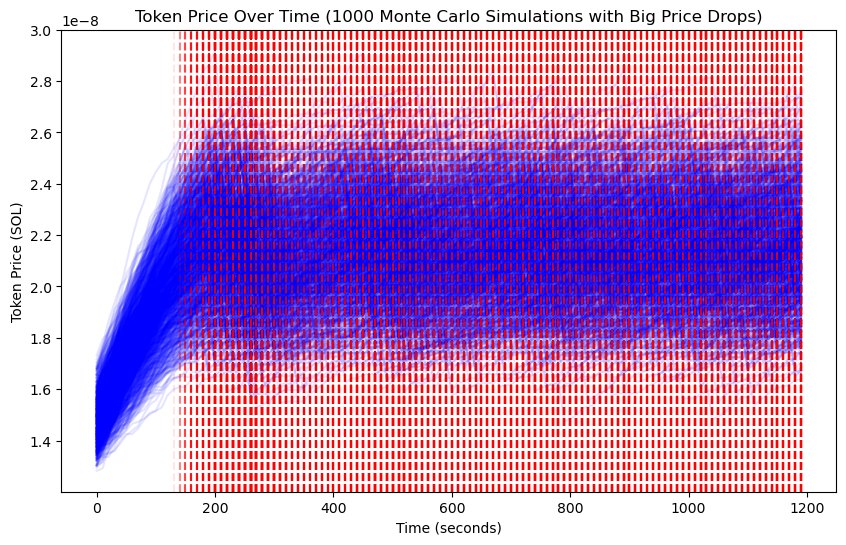

Developer's final profit in the first simulation: 0.00 SOL


In [42]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Simulation Parameters
num_simulations = 1000  # Number of Monte Carlo simulations
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds
price_drop_threshold = -0.05  # Threshold for identifying significant price drops (5% drop)

# Lists to store simulation results
all_token_prices_over_time = []
all_price_drops_over_time = []

# Monte Carlo Simulation Loop
for sim in range(num_simulations):
    # Step 1: Developer creates the pool (Aggressive Dev)
    dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
    dev_pool = dev.start_pool()

    # Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
    num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
    prebuyers = []
    aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
    prebuyers.append(aggressive_prebuyer)

    # Add normal pre-buyers
    for i in range(num_prebuyers):
        sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
        strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
        prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

    # Step 3: Protocol manages the pre-buying bidding process
    protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)
    total_bidding_time = 900  # 15 minutes in seconds
    final_ranking = protocol.start_bidding(total_bidding_time)

    # Step 4: Compute token allocation for pre-buyers and dev
    dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
    token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

    # Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
    pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

    # Step 6: Introduce real buyers into the pump.fun pool
    num_buyers = random.randint(5, 10)  # Number of real buyers
    buyers = []
    for i in range(num_buyers):
        sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
        buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

    # Lists to store data for plotting within this simulation
    token_prices_over_time = []
    price_drops_over_time = []  # To store moments of big price drops
    previous_price = None

    # Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
    for second in range(withdrawal_duration_seconds):
        if second % interaction_interval_seconds == 0:
            # Each buyer either buys or sells randomly at this tick
            for buyer in buyers:
                action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)
                if action <= 0.5:  # 50% probability of buying
                    buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                    buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                else:  # 50% probability of selling
                    if buyer.tokens > 0:
                        sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                        buyer.sell_tokens(pump_fun, sol_price, sell_amount)

            # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
            dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if dev_unlocked_tokens > 0:
                dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())

            for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
                prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                    current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
                if prebuyer_unlocked_tokens > 0:
                    prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

            # Update token price and track price differences
            token_price = pump_fun.get_token_price()
            token_prices_over_time.append(token_price)

            if previous_price is not None:
                price_difference = token_price - previous_price
                # If price drop exceeds the threshold, track the event
                if price_difference / previous_price < price_drop_threshold:
                    price_drops_over_time.append(second)
            previous_price = token_price

    # Store results for this simulation
    all_token_prices_over_time.append(token_prices_over_time)
    all_price_drops_over_time.append(price_drops_over_time)

# Plot Monte Carlo Results
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)

# Plot 1000 token price trajectories
plt.figure(figsize=(10, 6))
for i, token_prices in enumerate(all_token_prices_over_time):
    plt.plot(time_ticks, token_prices, color='blue', alpha=0.1)

    # Highlight the big price drops with red vertical lines
    for drop_time in all_price_drops_over_time[i]:
        plt.axvline(x=drop_time, color='red', linestyle='--', alpha=0.1)

plt.xlabel("Time (seconds)")
plt.ylabel("Token Price (SOL)")
plt.title("Token Price Over Time (1000 Monte Carlo Simulations with Big Price Drops)")
plt.show()

# Example: Developer's final profit in the first simulation
print(f"Developer's final profit in the first simulation: {dev.get_profit():.2f} SOL")


Developer is allocated 430063114.05 tokens.
Buyer 4 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 3 doe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Developer is allocated 393377998.33 tokens.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 10 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 10 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 9 d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Developer is allocated 440093571.30 tokens.
Buyer 2 does not have enough tokens to sell.
Buyer 6 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 4 does not have enough tokens to sell.
Buyer 5 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 2 does not have enough tokens to sell.
Buyer 3 does not have enough tokens to sell.
Buyer 7 does not have enough tokens to sell.
Buyer 8 does not have enough tokens to sell.
Buyer 9 does not have enough tokens to sell.
Buyer 1 does not have enough tokens to sell.
Buyer 2 doe

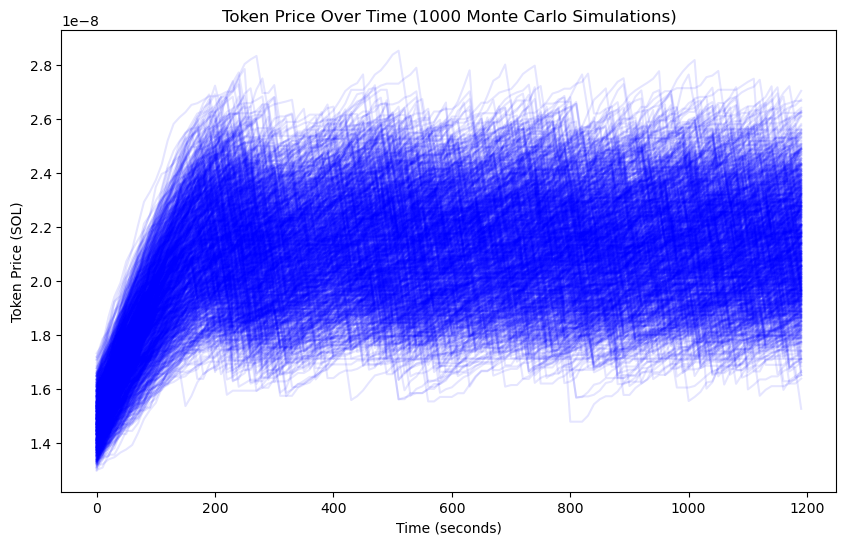

In [43]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Simulation Parameters
num_simulations = 1000  # Number of Monte Carlo simulations
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds
price_drop_threshold = -0.05  # Threshold for identifying significant price drops (5% drop)

# Lists to store simulation results
all_token_prices_over_time = []
all_price_drops_over_time = []

# Monte Carlo Simulation Loop
for sim in range(num_simulations):
    # Step 1: Developer creates the pool (Aggressive Dev)
    dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
    dev_pool = dev.start_pool()

    # Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
    num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
    prebuyers = []
    aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
    prebuyers.append(aggressive_prebuyer)

    # Add normal pre-buyers
    for i in range(num_prebuyers):
        sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
        strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
        prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

    # Step 3: Protocol manages the pre-buying bidding process
    protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)
    total_bidding_time = 900  # 15 minutes in seconds
    final_ranking = protocol.start_bidding(total_bidding_time)

    # Step 4: Compute token allocation for pre-buyers and dev
    dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
    token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

    # Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
    pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

    # Step 6: Introduce real buyers into the pump.fun pool
    num_buyers = random.randint(5, 10)  # Number of real buyers
    buyers = []
    for i in range(num_buyers):
        sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
        buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

    # Lists to store data for plotting within this simulation
    token_prices_over_time = []
    price_drops_over_time = []  # To store moments of big price drops
    previous_price = None

    # Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
    for second in range(withdrawal_duration_seconds):
        if second % interaction_interval_seconds == 0:
            # Each buyer either buys or sells randomly at this tick
            for buyer in buyers:
                action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)
                if action <= 0.5:  # 50% probability of buying
                    buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                    buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                else:  # 50% probability of selling
                    if buyer.tokens > 0:
                        sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                        buyer.sell_tokens(pump_fun, sol_price, sell_amount)

            # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
            dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if dev_unlocked_tokens > 0:
                dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())

            for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
                prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                    current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
                if prebuyer_unlocked_tokens > 0:
                    prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

            # Update token price and track price differences
            token_price = pump_fun.get_token_price()
            token_prices_over_time.append(token_price)

            if previous_price is not None:
                price_difference = token_price - previous_price
                # If price drop exceeds the threshold, track the event
                if price_difference / previous_price < price_drop_threshold:
                    price_drops_over_time.append(second)
            previous_price = token_price

    # Store results for this simulation
    all_token_prices_over_time.append(token_prices_over_time)
    all_price_drops_over_time.append(price_drops_over_time)

# Plot Monte Carlo Results
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)

# Plot 1000 token price trajectories
plt.figure(figsize=(10, 6))
for i, token_prices in enumerate(all_token_prices_over_time):
    plt.plot(time_ticks, token_prices, color='blue', alpha=0.1)

plt.xlabel("Time (seconds)")
plt.ylabel("Token Price (SOL)")
plt.title("Token Price Over Time (1000 Monte Carlo Simulations)")
plt.show()


In [44]:
class BuyerClass:
    def __init__(self, sol_amount: float, buyer_id: int):
        """
        Initialize a real buyer who interacts with the pump.fun pool.
        
        :param sol_amount: The amount of SOL the buyer wants to use to interact with the pool.
        :param buyer_id: A unique ID for each buyer.
        """
        self.sol_amount = sol_amount
        self.buyer_id = buyer_id  # Unique ID to track buyers
        self.tokens = 0  # Tokens start at 0 and accumulate through buying

    def buy_tokens(self, pump_fun_pool, sol_price: float, buy_amount: float):
        """
        The buyer buys a specified amount of tokens from the pump.fun pool.
        
        :param pump_fun_pool: The pump.fun pool where the buyer interacts.
        :param sol_price: The current price of SOL (used to compute the purchase).
        :param buy_amount: The amount of SOL the buyer wants to use for this purchase.
        :return: The number of tokens bought.
        """
        if self.sol_amount >= buy_amount:  # Ensure the buyer has enough SOL to spend
            tokens_bought = buy_amount / sol_price  # Calculate tokens bought based on SOL price
            self.tokens += tokens_bought  # Add bought tokens to buyer's balance
            self.sol_amount -= buy_amount  # Deduct the spent SOL from buyer's total SOL
            pump_fun_pool.update_mcap(buy_amount)  # Update pool's Mcap based on the SOL used
            return tokens_bought
        else:
            return 0  # Removed the print statement

    def sell_tokens(self, pump_fun_pool, sol_price: float, sell_amount: float):
        """
        The buyer sells a specified amount of tokens back to the pool.
        
        :param pump_fun_pool: The pump.fun pool where the buyer interacts.
        :param sol_price: The current price of SOL (used to compute the sale).
        :param sell_amount: The amount of tokens the buyer wants to sell.
        :return: The amount of SOL earned from selling.
        """
        if self.tokens >= sell_amount:  # Ensure the buyer has enough tokens to sell
            sol_earned = sell_amount * sol_price  # Calculate SOL earned from selling tokens
            pump_fun_pool.update_mcap(-sol_earned)  # Update Mcap negatively for selling
            self.tokens -= sell_amount  # Deduct sold tokens from buyer's balance
            self.sol_amount += sol_earned  # Add earned SOL to buyer's SOL balance
            return sol_earned
        else:
            return 0  # Removed the print statement


Developer is allocated 419041671.65 tokens.
Developer is allocated 385125009.31 tokens.
Developer is allocated 395161767.84 tokens.
Developer is allocated 422496727.11 tokens.
Developer is allocated 392273712.55 tokens.
Developer is allocated 406576414.45 tokens.
Developer is allocated 391191819.09 tokens.
Developer is allocated 417471730.93 tokens.
Developer is allocated 392260016.88 tokens.
Developer is allocated 391836859.45 tokens.
Developer is allocated 408550185.19 tokens.
Developer is allocated 395517979.30 tokens.
Developer is allocated 428612985.72 tokens.
Developer is allocated 401109471.43 tokens.
Developer is allocated 371317188.02 tokens.
Developer is allocated 405730678.19 tokens.
Developer is allocated 428565126.26 tokens.
Developer is allocated 417009795.23 tokens.
Developer is allocated 426826025.96 tokens.
Developer is allocated 394282683.04 tokens.
Developer is allocated 424312135.21 tokens.
Developer is allocated 401133968.05 tokens.
Developer is allocated 434421115

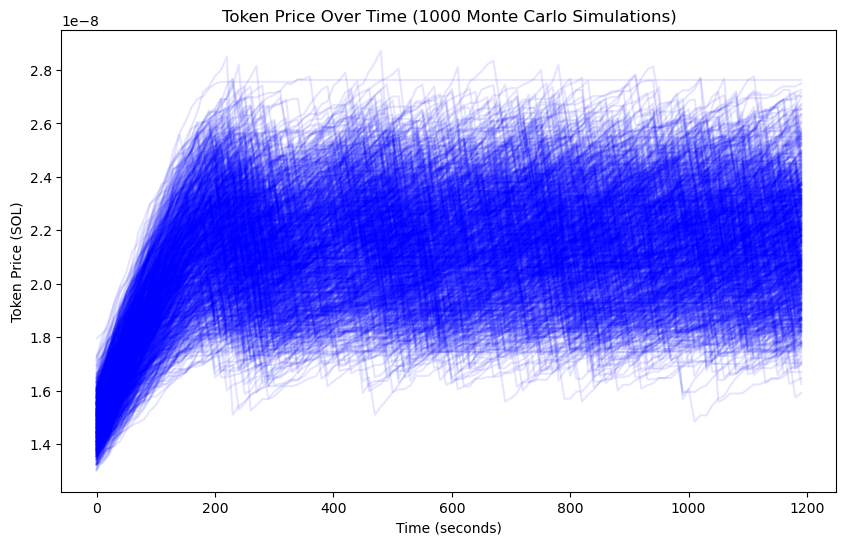

In [45]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Simulation Parameters
num_simulations = 1000  # Number of Monte Carlo simulations
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds
price_drop_threshold = -0.05  # Threshold for identifying significant price drops (5% drop)

# Lists to store simulation results
all_token_prices_over_time = []
all_price_drops_over_time = []

# Monte Carlo Simulation Loop
for sim in range(num_simulations):
    # Step 1: Developer creates the pool (Aggressive Dev)
    dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
    dev_pool = dev.start_pool()

    # Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
    num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
    prebuyers = []
    aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
    prebuyers.append(aggressive_prebuyer)

    # Add normal pre-buyers
    for i in range(num_prebuyers):
        sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
        strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
        prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

    # Step 3: Protocol manages the pre-buying bidding process
    protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)
    total_bidding_time = 900  # 15 minutes in seconds
    final_ranking = protocol.start_bidding(total_bidding_time)

    # Step 4: Compute token allocation for pre-buyers and dev
    dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
    token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

    # Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
    pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

    # Step 6: Introduce real buyers into the pump.fun pool
    num_buyers = random.randint(5, 10)  # Number of real buyers
    buyers = []
    for i in range(num_buyers):
        sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
        buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

    # Lists to store data for plotting within this simulation
    token_prices_over_time = []
    price_drops_over_time = []  # To store moments of big price drops
    previous_price = None

    # Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
    for second in range(withdrawal_duration_seconds):
        if second % interaction_interval_seconds == 0:
            # Each buyer either buys or sells randomly at this tick
            for buyer in buyers:
                action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)
                if action <= 0.5:  # 50% probability of buying
                    buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                    buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                else:  # 50% probability of selling
                    if buyer.tokens > 0:
                        sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                        buyer.sell_tokens(pump_fun, sol_price, sell_amount)

            # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
            dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if dev_unlocked_tokens > 0:
                dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())

            for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
                prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                    current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
                if prebuyer_unlocked_tokens > 0:
                    prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

            # Update token price and track price differences
            token_price = pump_fun.get_token_price()
            token_prices_over_time.append(token_price)

            if previous_price is not None:
                price_difference = token_price - previous_price
                # If price drop exceeds the threshold, track the event
                if price_difference / previous_price < price_drop_threshold:
                    price_drops_over_time.append(second)
            previous_price = token_price

    # Store results for this simulation
    all_token_prices_over_time.append(token_prices_over_time)
    all_price_drops_over_time.append(price_drops_over_time)

# Plot Monte Carlo Results
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)

# Plot 1000 token price trajectories
plt.figure(figsize=(10, 6))
for i, token_prices in enumerate(all_token_prices_over_time):
    plt.plot(time_ticks, token_prices, color='blue', alpha=0.1)

plt.xlabel("Time (seconds)")
plt.ylabel("Token Price (SOL)")
plt.title("Token Price Over Time (1000 Monte Carlo Simulations)")
plt.show()


Developer is allocated 430596229.37 tokens.
Developer is allocated 422576213.59 tokens.
Developer is allocated 416776685.39 tokens.
Developer is allocated 408637550.22 tokens.
Developer is allocated 406572364.55 tokens.
Developer is allocated 404290057.84 tokens.
Developer is allocated 406977626.32 tokens.
Developer is allocated 402278413.93 tokens.
Developer is allocated 408823583.54 tokens.
Developer is allocated 397899357.61 tokens.
Developer is allocated 405210561.48 tokens.
Developer is allocated 398056195.12 tokens.
Developer is allocated 384472629.58 tokens.
Developer is allocated 409800317.73 tokens.
Developer is allocated 433940668.95 tokens.
Developer is allocated 437109441.10 tokens.
Developer is allocated 390948951.73 tokens.
Developer is allocated 429090258.30 tokens.
Developer is allocated 409182470.61 tokens.
Developer is allocated 426250018.46 tokens.
Developer is allocated 409614074.58 tokens.
Developer is allocated 402762566.48 tokens.
Developer is allocated 410970613

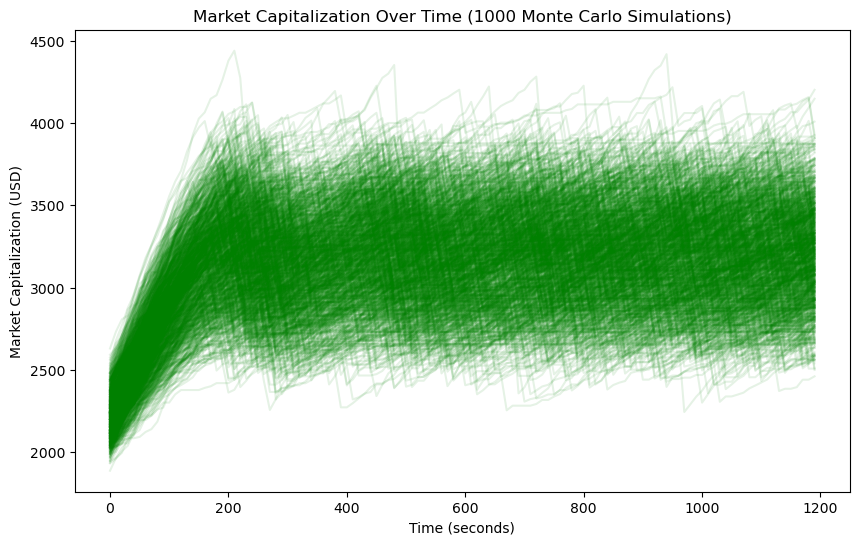

In [56]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Simulation Parameters
num_simulations = 1000  # Number of Monte Carlo simulations
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds
price_drop_threshold = -0.05  # Threshold for identifying significant price drops (5% drop)

# Lists to store simulation results
all_mcap_over_time = []

# Monte Carlo Simulation Loop
for sim in range(num_simulations):
    # Step 1: Developer creates the pool (Aggressive Dev)
    dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
    dev_pool = dev.start_pool()

    # Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
    num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
    prebuyers = []
    aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
    prebuyers.append(aggressive_prebuyer)

    # Add normal pre-buyers
    for i in range(num_prebuyers):
        sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
        strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
        prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

    # Step 3: Protocol manages the pre-buying bidding process
    protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)
    total_bidding_time = 900  # 15 minutes in seconds
    final_ranking = protocol.start_bidding(total_bidding_time)

    # Step 4: Compute token allocation for pre-buyers and dev
    dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
    token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

    # Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
    pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

    # Step 6: Introduce real buyers into the pump.fun pool
    num_buyers = random.randint(5, 10)  # Number of real buyers
    buyers = []
    for i in range(num_buyers):
        sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
        buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

    # Lists to store data for plotting within this simulation
    mcap_over_time = []

    # Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
    for second in range(withdrawal_duration_seconds):
        if second % interaction_interval_seconds == 0:
            # Each buyer either buys or sells randomly at this tick
            for buyer in buyers:
                action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)
                if action <= 0.5:  # 50% probability of buying
                    buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                    buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                else:  # 50% probability of selling
                    if buyer.tokens > 0:
                        sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                        buyer.sell_tokens(pump_fun, sol_price, sell_amount)

            # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
            dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if dev_unlocked_tokens > 0:
                dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())

            for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
                prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                    current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
                if prebuyer_unlocked_tokens > 0:
                    prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

            # Update Mcap
            current_mcap = pump_fun.get_mcap_statistics()
            mcap_over_time.append(current_mcap)

    # Store results for this simulation
    all_mcap_over_time.append(mcap_over_time)

# Plot Monte Carlo Results
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)

# Plot 1000 market capitalization trajectories
plt.figure(figsize=(10, 6))
for mcap_over_time in all_mcap_over_time:
    plt.plot(time_ticks, mcap_over_time, color='green', alpha=0.1)

plt.xlabel("Time (seconds)")
plt.ylabel("Market Capitalization (USD)")
plt.title("Market Capitalization Over Time (1000 Monte Carlo Simulations)")
plt.show()


Developer is allocated 405388167.35 tokens.
Developer is allocated 410277310.78 tokens.
Developer is allocated 383874947.05 tokens.
Developer is allocated 400175971.91 tokens.
Developer is allocated 385161411.74 tokens.
Developer is allocated 408907006.43 tokens.
Developer is allocated 406353770.14 tokens.
Developer is allocated 398258228.13 tokens.
Developer is allocated 425055156.01 tokens.
Developer is allocated 396544783.18 tokens.
Developer is allocated 404802267.09 tokens.
Developer is allocated 427531777.95 tokens.
Developer is allocated 420791134.40 tokens.
Developer is allocated 431884433.43 tokens.
Developer is allocated 390531471.48 tokens.
Developer is allocated 404099838.74 tokens.
Developer is allocated 409764431.99 tokens.
Developer is allocated 430416237.94 tokens.
Developer is allocated 423665925.55 tokens.
Developer is allocated 409907872.18 tokens.
Developer is allocated 408864323.74 tokens.
Developer is allocated 440509026.26 tokens.
Developer is allocated 420766127

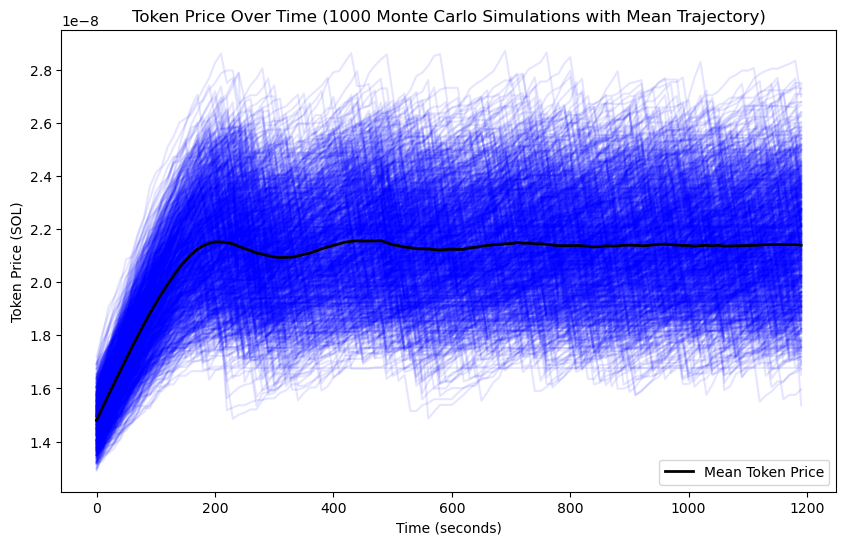

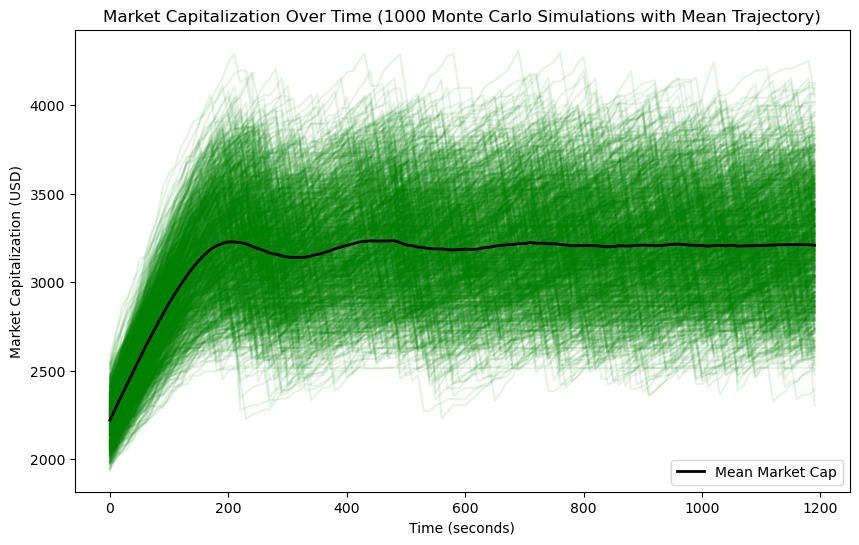

In [57]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Simulation Parameters
num_simulations = 1000  # Number of Monte Carlo simulations
sol_price = 150  # USD value of SOL
total_token_supply = 1_000_000_000  # 1 billion tokens total
withdrawal_duration_seconds = 1200  # 20 minutes in seconds
interaction_interval_seconds = 10  # Buyers interact with the pool every 10 seconds
price_drop_threshold = -0.05  # Threshold for identifying significant price drops (5% drop)

# Lists to store simulation results
all_token_prices_over_time = []
all_mcap_over_time = []

# Monte Carlo Simulation Loop
for sim in range(num_simulations):
    # Step 1: Developer creates the pool (Aggressive Dev)
    dev = AggressiveDevClass(token_name="MemeCoin", sol_amount=10, buyback_amount=3, order_lifetime=15)
    dev_pool = dev.start_pool()

    # Step 2: Randomly generate pre-buyers (including aggressive pre-buyer)
    num_prebuyers = random.randint(5, 15)  # Random number of pre-buyers between 5 and 15
    prebuyers = []
    aggressive_prebuyer = PreBuyerClass(sol_amount=2.0, coin_name="MemeCoin", bidding_strategy="always_bid_highest")
    prebuyers.append(aggressive_prebuyer)

    # Add normal pre-buyers
    for i in range(num_prebuyers):
        sol_amount = random.uniform(0.1, 0.5)  # Each pre-buyer has a random SOL amount
        strategy = random.choice(["bid_once", "rebid_every_2_minutes", "bid_at_end"])  # Different strategies
        prebuyers.append(PreBuyerClass(sol_amount=sol_amount, coin_name="MemeCoin", bidding_strategy=strategy))

    # Step 3: Protocol manages the pre-buying bidding process
    protocol = ProtocolClass(dev_pool=dev_pool, prebuyers=prebuyers)
    total_bidding_time = 900  # 15 minutes in seconds
    final_ranking = protocol.start_bidding(total_bidding_time)

    # Step 4: Compute token allocation for pre-buyers and dev
    dev_token_allocation = protocol.compute_dev_allocation()  # Dev’s token allocation
    token_allocations = protocol.compute_coin_allocation()  # Pre-buyers' token allocation

    # Initialize pump.fun with SOL in pool and total tokens in pool (1 billion tokens)
    pump_fun = PumpFunClass(initial_sol_in_pool=protocol.sol_pool, total_tokens_in_pool=protocol.total_coin_supply)

    # Step 6: Introduce real buyers into the pump.fun pool
    num_buyers = random.randint(5, 10)  # Number of real buyers
    buyers = []
    for i in range(num_buyers):
        sol_amount = random.uniform(0.5, 2.0)  # Each buyer has a random amount of SOL
        buyers.append(BuyerClass(sol_amount=sol_amount, buyer_id=i+1))

    # Lists to store data for plotting within this simulation
    token_prices_over_time = []
    mcap_over_time = []

    # Simulate the 20-minute withdrawal process with buyer interactions every 10 seconds
    for second in range(withdrawal_duration_seconds):
        if second % interaction_interval_seconds == 0:
            # Each buyer either buys or sells randomly at this tick
            for buyer in buyers:
                action = random.random()  # Generate a random number to decide action (50/50 chance of buying/selling)
                if action <= 0.5:  # 50% probability of buying
                    buy_amount = random.uniform(0.05, 0.2)  # Buyers buy a random amount of tokens
                    buyer.buy_tokens(pump_fun, sol_price, buy_amount)
                else:  # 50% probability of selling
                    if buyer.tokens > 0:
                        sell_amount = random.uniform(0.01, buyer.tokens)  # Sell a random fraction of tokens
                        buyer.sell_tokens(pump_fun, sol_price, sell_amount)

            # Unlock tokens for the developer and aggressive pre-buyer, and they sell immediately
            dev_unlocked_tokens = unlock_mechanism_dev.unlock_tokens(
                current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
            if dev_unlocked_tokens > 0:
                dev.sell_received_tokens(token_amount=dev_unlocked_tokens, token_price=pump_fun.get_token_price())

            for prebuyer, unlock_mechanism in unlock_mechanism_prebuyers.items():
                prebuyer_unlocked_tokens = unlock_mechanism.unlock_tokens(
                    current_time=second, total_time=withdrawal_duration_seconds, mcap=pump_fun.get_mcap_statistics())
                if prebuyer_unlocked_tokens > 0:
                    prebuyer.sell_received_tokens(token_amount=prebuyer_unlocked_tokens, token_price=pump_fun.get_token_price())

            # Update token price and Mcap
            token_price = pump_fun.get_token_price()
            token_prices_over_time.append(token_price)

            current_mcap = pump_fun.get_mcap_statistics()
            mcap_over_time.append(current_mcap)

    # Store results for this simulation
    all_token_prices_over_time.append(token_prices_over_time)
    all_mcap_over_time.append(mcap_over_time)

# Convert results to numpy arrays for easy manipulation
all_token_prices_over_time = np.array(all_token_prices_over_time)
all_mcap_over_time = np.array(all_mcap_over_time)

# Calculate mean trajectories
mean_token_prices = np.mean(all_token_prices_over_time, axis=0)
mean_mcap = np.mean(all_mcap_over_time, axis=0)

# Plot Monte Carlo Results
time_ticks = np.arange(0, withdrawal_duration_seconds, interaction_interval_seconds)

# Plot 1000 token price trajectories
plt.figure(figsize=(10, 6))
for token_prices in all_token_prices_over_time:
    plt.plot(time_ticks, token_prices, color='blue', alpha=0.1)

# Plot the mean token price trajectory
plt.plot(time_ticks, mean_token_prices, color='black', label='Mean Token Price', linewidth=2)

plt.xlabel("Time (seconds)")
plt.ylabel("Token Price (SOL)")
plt.title("Token Price Over Time (1000 Monte Carlo Simulations with Mean Trajectory)")
plt.legend()
plt.show()

# Plot 1000 market capitalization trajectories
plt.figure(figsize=(10, 6))
for mcap in all_mcap_over_time:
    plt.plot(time_ticks, mcap, color='green', alpha=0.1)

# Plot the mean market capitalization trajectory
plt.plot(time_ticks, mean_mcap, color='black', label='Mean Market Cap', linewidth=2)

plt.xlabel("Time (seconds)")
plt.ylabel("Market Capitalization (USD)")
plt.title("Market Capitalization Over Time (1000 Monte Carlo Simulations with Mean Trajectory)")
plt.legend()
plt.show()
